# **What is Hyperparameter Tuning ?**

Let's start off with what a **Hyperparameter** is !

A **Hyperparameter** is a property of a learning algorithm that influences how the algorithm works. It is NOT learned by the data or algorithm itself, and is set by the model developer before training.

**Hyperparameter Tuning** refers to the process of experimentally finding the combination of values for each hyperparameter that best suites the learning algorithm and data.

**List of Hyperparameters we will be going over**

---

- *Number Hidden Layers*
- *Neurons per Layer*
- *Optimizer*
- *Activation Function*
- *Batch Size*
- *Loss Function*

**Different Tuning Techniques**

---
- *Grid Search*
- *Bayesian Optimization*
- *Random Search*




# **DATA**


Data sourced from:

---


https://github.com/conrad-blucher-institute/LagunaMadreWaterAirTempDataCleaner/blob/main/imputed_data/atp_and_wtp_2016.csv


**Model**


---
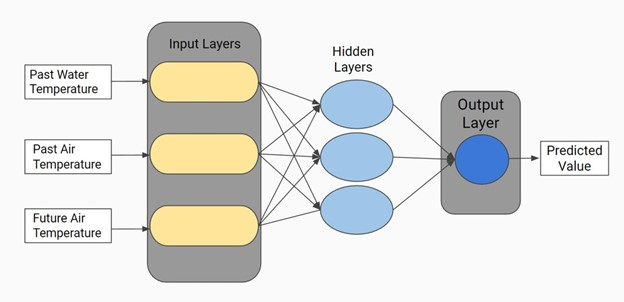

Function below to create input structure for model to be able to interpret

In [18]:
# Creating model input structure
def creatingAdditionalColumns(df, input_hours_forecast, atp_hours_back, wtp_hours_back):
    '''creatingAdditionalColumns() creating columns for the past and future (perfect prog) hours'''

    # Creating past air temperature values
    for i in range(atp_hours_back):

        j = i + 1
        con = []

        name = 'air_temperature_' + str(j) + 'h_ago'

        for k in range(j):  # Creating missing values rows for the previous five days
            con.append(-999)

        for w in range(len(df)-(j)):   # Creating past columns
            temp = df['packeryATP_lighthouse'][w]
            con.append(temp)

        df[name] = con

    # Creating past water temperature values
    for i in range(wtp_hours_back):

        j = i + 1
        con = []

        name = 'water_temperature_' + str(j) + 'h_ago'

        for k in range(j):    # Creating missing values rows for the previous five days
            con.append(-999)

        for w in range(len(df)-(j)):
            temp = df['npsbiWTP_lighthouse'][w]     # Creating past columns
            con.append(temp)

        df[name] = con

    # Predicted air temperature (perfect prog)
    for i in range(input_hours_forecast):

        j = i + 1
        con = []

        name = 'air_temperature_' + str(j) + 'h_predicted'

        for w in range(len(df) - (i)):
            temp = df['packeryATP_lighthouse'][w + i]    # Creating future columns
            con.append(temp)

        for k in range(i):      # Creating missing values rows for the next five days
            con.append(-999)

        df[name] = con


    # Creating a list used to create the future columns
    kList_wtp = []

    for z in range(input_hours_forecast):

        temp_wtp = (z + 1)
        kList_wtp.append(temp_wtp)

        if(z == input_hours_forecast - 1):
            value_wtp = temp_wtp

    # Creating target
    con = []

    name = 'waterTemperature_' + str(input_hours_forecast) + 'h_forecast'

    for w in range(len(df) - (input_hours_forecast)):
        temp = df['npsbiWTP_lighthouse'][w+(input_hours_forecast)] #-1
        con.append(temp)

    for k in range(input_hours_forecast):
        con.append(-999)

    df[name] = con

    # Delecting extra rows from the beginning
    df = df.iloc[120:]

    # Delecting extra rows from the end
    df = df.iloc[:-120]

    # separating the columns (water temperature xh_ago, air temperature xh_ago, and air temperature xh_forecast)
    water_temp_columns = [col for col in df.columns if "water_temperature_" in col]
    air_temp_columns = [col for col in df.columns if "air_temperature_" in col and "_ago" in col]
    forecast_columns = [col for col in df.columns if "forecast" in col or 'predicted' in col]


    # the datetime, current wtp and current atp
    other_columns = [col for col in df.columns if col not in water_temp_columns + air_temp_columns + forecast_columns]
    # removing current wtp and atp from list to be added back in the appropriate location

    if "npsbiWTP_lighthouse" in other_columns:
        other_columns.remove("npsbiWTP_lighthouse")
    if "packeryATP_lighthouse" in other_columns:
        other_columns.remove("packeryATP_lighthouse")

    # Reorder columns
    reordered_columns = (
        other_columns
        + water_temp_columns[::-1]
        + ["npsbiWTP_lighthouse"]
        + air_temp_columns[::-1]
        + ["packeryATP_lighthouse"]
        + forecast_columns
    )

    df = df[reordered_columns]
    return df

Pandas: https://pandas.pydata.org/docs/reference/index.html


In [19]:
import pandas as pd   # pandas is a great package to analyze and manipulate data
from google.colab import files
files.upload()

Saving atp_and_wtp_2016.csv to atp_and_wtp_2016 (1).csv


{'atp_and_wtp_2016 (1).csv': b'dateAndTime,packeryATP_lighthouse,npsbiWTP_lighthouse\n01-01-2016 0000,11.3,12.9\n01-01-2016 0100,12.0,12.8\n01-01-2016 0200,12.0,12.7\n01-01-2016 0300,12.4,12.7\n01-01-2016 0400,12.7,12.5\n01-01-2016 0500,12.5,12.4\n01-01-2016 0600,12.3,12.4\n01-01-2016 0700,12.1,12.3\n01-01-2016 0800,12.0,12.2\n01-01-2016 0900,11.7,12.2\n01-01-2016 1000,11.6,12.2\n01-01-2016 1100,11.3,12.1\n01-01-2016 1200,11.2,12.0\n01-01-2016 1300,10.6,12.0\n01-01-2016 1400,10.5,11.9\n01-01-2016 1500,9.8,11.8\n01-01-2016 1600,9.7,11.9\n01-01-2016 1700,9.1,11.8\n01-01-2016 1800,8.8,11.9\n01-01-2016 1900,8.8,12.0\n01-01-2016 2000,8.7,12.0\n01-01-2016 2100,8.4,11.8\n01-01-2016 2200,8.6,11.9\n01-01-2016 2300,9.1,11.7\n01-02-2016 0000,8.8,11.7\n01-02-2016 0100,8.6,11.7\n01-02-2016 0200,8.4,11.6\n01-02-2016 0300,8.1,11.5\n01-02-2016 0400,7.6,11.4\n01-02-2016 0500,7.6,11.0\n01-02-2016 0600,7.5,10.9\n01-02-2016 0700,7.5,10.9\n01-02-2016 0800,7.5,10.8\n01-02-2016 0900,7.3,10.5\n01-02-2016 1000

<Axes: >

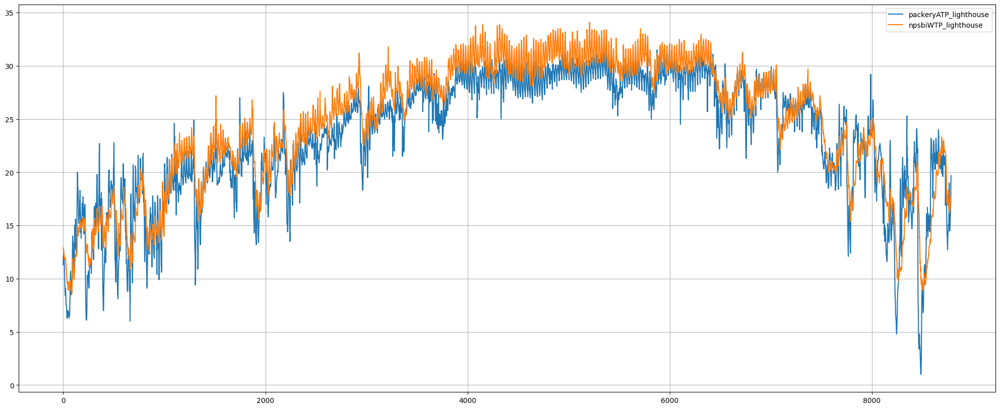

In [20]:
df = pd.read_csv("atp_and_wtp_2016.csv")
df.plot(grid=True, figsize=(25,10)) # plotting dataaset

In [21]:
forecast = 12   # Defining number of hours forecast
atp_hours_back = 6
wtp_hours_back = 6

input_df = creatingAdditionalColumns(df, forecast, atp_hours_back, wtp_hours_back) # using function to create input structure
input_df.isna().sum().sum() # checking the number of missing valules

19

In [22]:
input_df = input_df.interpolate('linear') # linearly interpolating

<ipython-input-22-22d7715ef7cc>:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  input_df = input_df.interpolate('linear') # linearly interpolating


In [23]:
input_df.isna().sum().sum() # checking the number of missing values

0

In [24]:
# Splitting our data into a train/val/test split of 80/10/10
eighty_percent = int(input_df.shape[0] * 0.80) # df.shape[0] refers to the number of rows in the dataframe
ten_percent = int(input_df.shape[0] * 0.10)

train = input_df.iloc[0:eighty_percent]            # first 80 percent of data
val = input_df.iloc[eighty_percent:-ten_percent]  # next 10 percent of data (from 80 to 90)
test = input_df.iloc[eighty_percent+ten_percent:] # final 10 percent of data (from 90 to 100)

In [25]:
train

,dateAndTime,water_temperature_6h_ago,water_temperature_5h_ago,water_temperature_4h_ago,water_temperature_3h_ago,water_temperature_2h_ago,water_temperature_1h_ago,npsbiWTP_lighthouse,air_temperature_6h_ago,air_temperature_5h_ago,...,air_temperature_4h_predicted,air_temperature_5h_predicted,air_temperature_6h_predicted,air_temperature_7h_predicted,air_temperature_8h_predicted,air_temperature_9h_predicted,air_temperature_10h_predicted,air_temperature_11h_predicted,air_temperature_12h_predicted,waterTemperature_12h_forecast
120,01-06-2016 0000,11.4,11.6,12.0,12.0,11.7,11.9,12.1,14.9,14.7,...,15.4,12.8,13.3,12.9,13.1,12.7,12.7,12.5,12.5,12.2
121,01-06-2016 0100,11.6,12.0,12.0,11.7,11.9,12.1,12.3,14.7,14.6,...,12.8,13.3,12.9,13.1,12.7,12.7,12.5,12.5,12.3,12.2
122,01-06-2016 0200,12.0,12.0,11.7,11.9,12.1,12.3,12.2,14.6,14.4,...,13.3,12.9,13.1,12.7,12.7,12.5,12.5,12.3,12.3,12.3
123,01-06-2016 0300,12.0,11.7,11.9,12.1,12.3,12.2,12.1,14.4,14.6,...,12.9,13.1,12.7,12.7,12.5,12.5,12.3,12.3,12.5,12.4
124,01-06-2016 0400,11.7,11.9,12.1,12.3,12.2,12.1,12.1,14.6,14.8,...,13.1,12.7,12.7,12.5,12.5,12.3,12.3,12.5,14.5,12.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6950,10-16-2016 1400,27.5,27.4,27.3,27.2,27.1,27.1,27.1,27.6,27.4,...,29.1,29.0,28.7,28.8,29.3,28.9,28.6,28.3,28.1,28.6
6951,10-16-2016 1500,27.4,27.3,27.2,27.1,27.1,27.1,27.4,27.4,27.4,...,29.0,28.7,28.8,29.3,28.9,28.6,28.3,28.1,28.1,28.4
6952,10-16-2016 1600,27.3,27.2,27.1,27.1,27.1,27.4,27.7,27.4,27.2,...,28.7,28.8,29.3,28.9,28.6,28.3,28.1,28.1,28.0,28.2
6953,10-16-2016 1700,27.2,27.1,27.1,27.1,27.4,27.7,28.1,27.2,27.0,...,28.8,29.3,28.9,28.6,28.3,28.1,28.1,28.0,28.1,28.0


In [ ]:
val

,dateAndTime,water_temperature_12h_ago,water_temperature_11h_ago,water_temperature_10h_ago,water_temperature_9h_ago,water_temperature_8h_ago,water_temperature_7h_ago,water_temperature_6h_ago,water_temperature_5h_ago,water_temperature_4h_ago,...,air_temperature_2h_ago,air_temperature_1h_ago,packeryATP_lighthouse,air_temperature_1h_predicted,air_temperature_2h_predicted,air_temperature_3h_predicted,air_temperature_4h_predicted,air_temperature_5h_predicted,air_temperature_6h_predicted,waterTemperature_6h_forecast
6955,10-16-2020 1900,28.0,27.9,27.8,27.7,27.5,27.1,26.8,26.7,26.3,...,19.9,19.2,17.9,17.9,18.0,17.8,18.0,18.2,18.6,24.0
6956,10-16-2020 2000,27.9,27.8,27.7,27.5,27.1,26.8,26.7,26.3,26.2,...,19.2,17.9,18.0,18.0,17.8,18.0,18.2,18.6,18.8,23.9
6957,10-16-2020 2100,27.8,27.7,27.5,27.1,26.8,26.7,26.3,26.2,25.9,...,17.9,18.0,17.8,17.8,18.0,18.2,18.6,18.8,19.0,24.1
6958,10-16-2020 2200,27.7,27.5,27.1,26.8,26.7,26.3,26.2,25.9,25.7,...,18.0,17.8,18.0,18.0,18.2,18.6,18.8,19.0,18.9,24.2
6959,10-16-2020 2300,27.5,27.1,26.8,26.7,26.3,26.2,25.9,25.7,25.2,...,17.8,18.0,18.2,18.2,18.6,18.8,19.0,18.9,19.0,24.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7805,11-21-2020 0500,22.6,23.1,23.4,23.4,24.0,24.7,24.4,24.1,24.4,...,23.8,23.9,23.4,23.4,23.1,23.0,23.2,22.9,22.8,23.1
7806,11-21-2020 0600,23.1,23.4,23.4,24.0,24.7,24.4,24.1,24.4,23.8,...,23.9,23.4,23.1,23.1,23.0,23.2,22.9,22.8,22.9,23.0
7807,11-21-2020 0700,23.4,23.4,24.0,24.7,24.4,24.1,24.4,23.8,23.7,...,23.4,23.1,23.0,23.0,23.2,22.9,22.8,22.9,23.0,22.9
7808,11-21-2020 0800,23.4,24.0,24.7,24.4,24.1,24.4,23.8,23.7,23.7,...,23.1,23.0,23.2,23.2,22.9,22.8,22.9,23.0,22.6,23.0


In [ ]:
test

,dateAndTime,water_temperature_12h_ago,water_temperature_11h_ago,water_temperature_10h_ago,water_temperature_9h_ago,water_temperature_8h_ago,water_temperature_7h_ago,water_temperature_6h_ago,water_temperature_5h_ago,water_temperature_4h_ago,...,air_temperature_2h_ago,air_temperature_1h_ago,packeryATP_lighthouse,air_temperature_1h_predicted,air_temperature_2h_predicted,air_temperature_3h_predicted,air_temperature_4h_predicted,air_temperature_5h_predicted,air_temperature_6h_predicted,waterTemperature_6h_forecast
7809,11-21-2020 0900,24.0,24.7,24.4,24.1,24.4,23.8,23.7,23.7,23.5,...,23.0,23.2,22.9,22.9,22.8,22.9,23.0,22.6,23.1,23.0
7810,11-21-2020 1000,24.7,24.4,24.1,24.4,23.8,23.7,23.7,23.5,23.5,...,23.2,22.9,22.8,22.8,22.9,23.0,22.6,23.1,23.8,23.2
7811,11-21-2020 1100,24.4,24.1,24.4,23.8,23.7,23.7,23.5,23.5,23.4,...,22.9,22.8,22.9,22.9,23.0,22.6,23.1,23.8,23.7,23.5
7812,11-21-2020 1200,24.1,24.4,23.8,23.7,23.7,23.5,23.5,23.4,23.2,...,22.8,22.9,23.0,23.0,22.6,23.1,23.8,23.7,23.9,23.7
7813,11-21-2020 1300,24.4,23.8,23.7,23.7,23.5,23.5,23.4,23.2,23.1,...,22.9,23.0,22.6,22.6,23.1,23.8,23.7,23.9,23.7,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8659,12-26-2020 1900,13.1,13.0,12.9,12.8,12.7,12.5,12.2,12.1,12.3,...,14.0,16.3,17.7,17.7,19.4,19.3,19.2,17.8,17.3,15.1
8660,12-26-2020 2000,13.0,12.9,12.8,12.7,12.5,12.2,12.1,12.3,12.7,...,16.3,17.7,19.4,19.4,19.3,19.2,17.8,17.3,17.3,15.0
8661,12-26-2020 2100,12.9,12.8,12.7,12.5,12.2,12.1,12.3,12.7,13.4,...,17.7,19.4,19.3,19.3,19.2,17.8,17.3,17.3,17.1,14.6
8662,12-26-2020 2200,12.8,12.7,12.5,12.2,12.1,12.3,12.7,13.4,14.1,...,19.4,19.3,19.2,19.2,17.8,17.3,17.3,17.1,17.2,14.6


In [8]:
# Removing datetime column
x_train = train.iloc[:,1:-1].values # full set of data to produce prediction value(s)
y_train  = train.iloc[:,-1].values  # target column to compare predictions against

x_val   = val.iloc[:,1:-1].values # full set of data to produce prediction value(s)
y_val   = val.iloc[:,-1].values # target column to compare predictions against

x_test  = test.iloc[:,1:-1].values  # full set of data to produce prediction value(s)
y_test  = test.iloc[:,-1].values  # target column to compare predictions against

In [ ]:
x_train

array([[11.4, 11.6, 12. , ..., 12.7, 12.5, 12.5],
       [11.6, 12. , 12. , ..., 12.5, 12.5, 12.3],
       [12. , 12. , 11.7, ..., 12.5, 12.3, 12.3],
       ...,
       [27.3, 27.2, 27.1, ..., 28.1, 28.1, 28. ],
       [27.2, 27.1, 27.1, ..., 28.1, 28. , 28.1],
       [27.1, 27.1, 27.1, ..., 28. , 28.1, 28.1]])

In [ ]:
y_train

array([12.2, 12.3, 12.3, ..., 29.4, 29.3, 29.1])

# **Hyperparameter Tuning**

**Libraries**


---

- Tensorflow   https://www.tensorflow.org/api_docs
- Keras:       https://keras.io/api/
- Keras-Tuner: https://keras.io/keras_tuner/api/



**List of Hyperparameters (Revisited)**

---

- *Number Hidden Layers*
- *Neurons per Layer*
- *Activation Function*
- *Optimizer*
- *Batch Size*
- *Loss Function*

In [9]:
# Input Neuron
input_shape = x_train[0].shape

# Number of layers
layer_list = [1, 2, 3, 4, 5]

# Number of neurons per layer
neuron_list = [32, 64, 128, 256, 512]

# Activation function per layer
activation_list = ['relu', 'selu', 'sigmoid', 'leaky_relu']

# Optimizers
optimizer_list = ['adam', 'sgd', 'adadelta', 'rmsp']

# Batch Size
batch_size_list = [64, 128, 256, 512, 1024, 2048, 4096]

# Loss function
loss_function_list = ['mse', 'mae', 'mape']



# Learning rate
learning_rate_list = [0.1, 0.001, 0.0001, 0.00001]

# Output Neuron (based on our dataset, we want an output prediction to be a single deterministic value)
output_units = 1

# Epochs
num_epochs = 10

# Metrics
metrics = ['mse', 'mae', 'mape']

In [26]:
import tensorflow as tf
import keras
from keras import Sequential
from keras.layers import Dense, Input

!pip install keras-tuner
import keras_tuner as kt


""" TUNING THE MODEL """
class MyHyperModel(kt.HyperModel):
    def build(self, hp):

        model = Sequential()

        # to tune for the number of neurons once, to then be appliead to all of the hidden layers
        # to maintain consistency amongst the layers

        layers = hp.Choice('layers', values=layer_list)

        neurons = hp.Choice('neurons_', values=neuron_list)

        act_func = hp.Choice('act_',values=activation_list)


        # first layer = input layer
        model.add(Input(shape=(input_shape)))

        # hidden layer(s) - Dense refers to a fully connected multi-layer perceptron
        for i in range(layers):
            model.add(Dense(units=neurons, activation=act_func))


        # last layer = output layer
        model.add(Dense(output_units))


        # Define the optimizer, learning rate as a hyperparameter to tune.
        chosen_optimizer = hp.Choice("optimizer", values=optimizer_list, ordered=False)

        if chosen_optimizer == "adam":
            model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp.Choice("learning_rate_",learning_rate_list, ordered=False)),
                        loss=hp.Choice("loss_function",loss_function_list, ordered=False), metrics=metrics)

        elif chosen_optimizer == "sgd":
            model.compile(optimizer=keras.optimizers.SGD(learning_rate=hp.Choice("learning_rate_",learning_rate_list, ordered=False)),
                        loss=hp.Choice("loss_function",loss_function_list, ordered=False), metrics=metrics)

        elif chosen_optimizer == "adadelta":
            model.compile(optimizer=keras.optimizers.Adadelta(learning_rate=hp.Choice("learning_rate_",learning_rate_list, ordered=False)),
                        loss=hp.Choice("loss_function",loss_function_list, ordered=False), metrics=metrics)

        elif chosen_optimizer == "rmsp":
            model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=hp.Choice("learning_rate_",learning_rate_list, ordered=False)),
                        loss=hp.Choice("loss_function",loss_function_list, ordered=False), metrics=metrics)


        return model

    def fit(self, hp, model, *args, **kwargs):
        batch = hp.Choice("batch_size", values=batch_size_list, ordered=False)
        history = model.fit(*args, batch_size=batch, **kwargs)

        return history

**Different Tuning Techniques (Revisited)**

---
- *Grid Search*
- *Bayesian Optimization*
- *Random Search*

In [17]:
from datetime import datetime
from google.colab import drive

drive.mount("/content/drive") # Mounting the Google Drive to be able to save results from tuner

save_path = "/content/drive/My Drive/HyperparameterTuning" # Path to where the tuner results are being saved to



obj = 'val_loss' # Score to measure the model performance

max_trials = 5  # Number of hyperparameter combinations tested

executions_per_trial = 1 # Number of times a set combination of hyperparameters are trained on (score is an average of these)

tuner_technique = "Random"

tuner = kt.RandomSearch(  # here change to either: BayesianOptimization, GridSearch, Random, etc
    hypermodel=MyHyperModel(),
    objective=kt.Objective(obj, direction="min"),
    overwrite=True,
    max_trials=max_trials,
    executions_per_trial=executions_per_trial,
    directory=save_path,
    project_name=save_path + f"/{tuner_technique}SearchResults"
    )


# Learning rate reducer; this updates and optimizes the learning rate over epochs based on change in score through epochs
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor=obj, min_delta=0.001,
                                              factor=0.1, patience=15, min_lr=0.00001)

# Early Stopping; this updates and optimizes the number of epochs to train on in order to have the best set of model weights
early_stopping = tf.keras.callbacks.EarlyStopping(monitor=obj,
                                  min_delta=0.001,
                                  patience=25,
                                  verbose=2,
                                  mode='auto',
                                  restore_best_weights=True)

# Saving model features through epoch
log_dir = save_path + f"/{tuner_technique}SearchResults/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Printing out the architecture that is selected based on the technique (random search used in this example)
#tuner.search_space_summary()

# Starts the training process
tuner.search(x_train, y_train, validation_data=(x_val, y_val),  epochs=num_epochs, callbacks=[early_stopping, reduce_lr, tensorboard_callback])

Trial 5 Complete [00h 00m 18s]
val_loss: 1539.984619140625

Best val_loss So Far: 0.8284429311752319
Total elapsed time: 00h 01m 01s


# **Accessing Tuner Results**

In [16]:
# Save all trials data to a CSV file
tuner_results_path = save_path + '/trial_results.csv'

tuner_results = []

for trial_id, trial in tuner.oracle.trials.items():

    trial_data = {
        'trial_id': trial_id,
        'score': trial.score,
        'status': trial.status,
        'best_step': trial.best_step,
        'val_loss': trial.metrics.get_best_value('val_loss'),
        'mae': trial.metrics.get_best_value('mae'),
        'mape': trial.metrics.get_best_value('mape'),
        'mse': trial.metrics.get_best_value('mse')
    }

    # Add hyperparameters
    trial_data.update(trial.hyperparameters.values)

    tuner_results.append(trial_data)



tuner_df = pd.DataFrame(tuner_results)
tuner_df.to_csv(tuner_results_path, index=False)

/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/metrics_tracking.py:111: RuntimeWarning: All-NaN axis encountered
  np.nanmin(values) if self.direction == "min" else np.nanmax(values)


OSError: Cannot save file into a non-existent directory: '/content/drive/My Drive/HyperparameterTuning'

In [ ]:
print(save_path)

/content/drive/My Drive/HyperparameterTuning


In [ ]:
%load_ext tensorboard

%tensorboard --logdir "/content/drive/My Drive/HyperparameterTuning/logs"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# **Summary**